<a href="https://colab.research.google.com/github/khuzaimanikhat/Codsoft/blob/main/Task_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
!wget https://storage.cmusatyalab.org/openface-models/nn4.small2.v1.t7

--2024-06-05 12:34:30--  https://storage.cmusatyalab.org/openface-models/nn4.small2.v1.t7
Resolving storage.cmusatyalab.org (storage.cmusatyalab.org)... 128.2.210.205
Connecting to storage.cmusatyalab.org (storage.cmusatyalab.org)|128.2.210.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31510785 (30M) [application/octet-stream]
Saving to: ‘nn4.small2.v1.t7’

nn4.small2.v1.t7    100%[===================>]  30.05M  7.37MB/s    in 4.2s    

2024-06-05 12:34:35 (7.13 MB/s) - ‘nn4.small2.v1.t7’ saved [31510785/31510785]



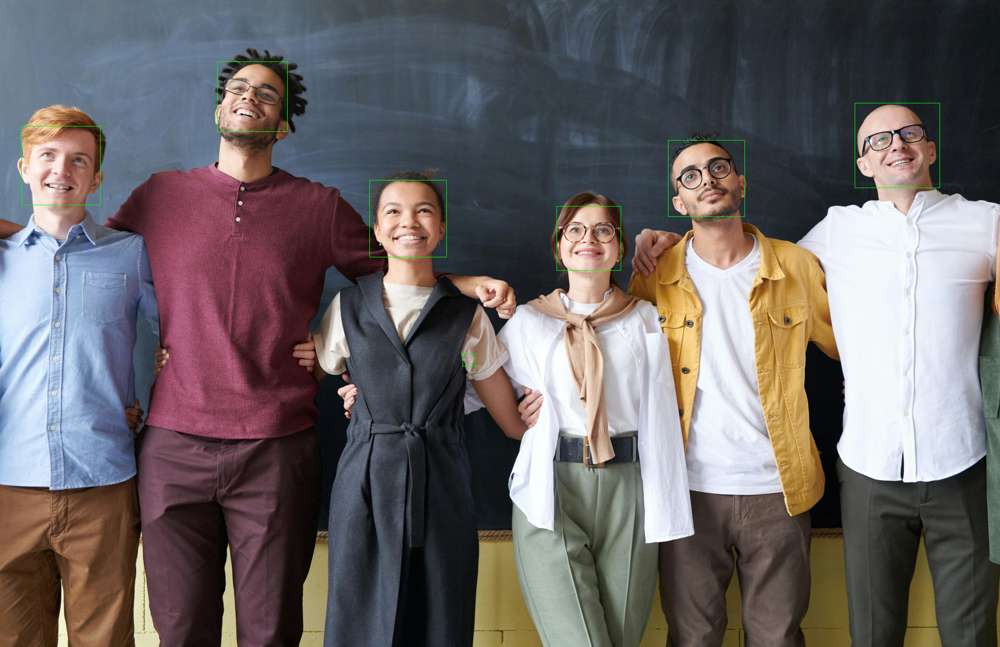

In [12]:
import cv2
import numpy as np
import urllib.request
from google.colab.patches import cv2_imshow

# Loading the pre-trained face detection cascade
cascade_url = 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml'
urllib.request.urlretrieve(cascade_url, 'haarcascade_frontalface_default.xml')
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Loading the pre-trained face recognition model (FaceNet)
model_url = 'https://storage.cmusatyalab.org/openface-models/nn4.small2.v1.t7'
urllib.request.urlretrieve(model_url, 'openface.nn4.small2.v1.t7')
model = cv2.dnn.readNetFromTorch('openface.nn4.small2.v1.t7')

# Loading a sample image
image = cv2.imread('sample_image.jpg')

# Converting the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detecting faces in the image
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

# Iterate over each face
for (x, y, w, h) in faces:
    # Crop the face from the image
    face = image[y:y+h, x:x+w]

    # Preprocess the face for FaceNet model
    faceBlob = cv2.dnn.blobFromImage(face, 1.0 / 255, (96, 96), (0, 0, 0), swapRB=True, crop=False)

    # Pass the faceBlob through the model to get embeddings
    model.setInput(faceBlob)
    embeddings = model.forward()

    # Drawing a rectangle around the face
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Displaying the image
cv2_imshow(image)
